# Mental Health Analysis

## Overview

## Business Problem

## Data Understanding

The data comes from [kaggle.com](https://www.kaggle.com/datasets/sonia22222/students-mental-health-assessments?select=students_mental_health_survey.csv). It consists of over 7,000 mental health surveys where college students provided information regarding their courses, sleep quality, physical activity, social support, and many more aspects of their lives. In this project I will be converting the Depression_Score to a binary target. Three or higher is Yes, this student has depression, and two or below means no, this student does not have depression. My goal is to find which aspects of a student's life has the greatest impact on their probability of having depression. 

In [1]:
# Imports
import pandas as pd
import numpy as np
from sklearn.preprocessing import normalize, OneHotEncoder, StandardScaler, OrdinalEncoder, PolynomialFeatures
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, GridSearchCV
from sklearn.dummy import DummyClassifier
from sklearn.metrics import mean_squared_error, accuracy_score, recall_score, make_scorer, confusion_matrix, ConfusionMatrixDisplay, f1_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, FeatureUnion
import statsmodels.api as sm
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
import pickle
from sklearn.ensemble import GradientBoostingClassifier

In [2]:
# Read the data in to a dataframe
df = pd.read_csv('data/students_mental_health_survey.csv')

In [3]:
df.head()

,Age,Course,Gender,CGPA,Stress_Level,Depression_Score,Anxiety_Score,Sleep_Quality,Physical_Activity,Diet_Quality,Social_Support,Relationship_Status,Substance_Use,Counseling_Service_Use,Family_History,Chronic_Illness,Financial_Stress,Extracurricular_Involvement,Semester_Credit_Load,Residence_Type
0,25,Others,Male,3.56,3,3,2,Good,Moderate,Good,Moderate,Married,Never,Never,No,No,2,Moderate,17,On-Campus
1,24,Engineering,Female,2.44,0,3,0,Average,Low,Average,Low,Single,Occasionally,Occasionally,No,No,3,Low,27,On-Campus
2,19,Business,Female,3.74,4,0,3,Good,Low,Average,Moderate,In a Relationship,Never,Occasionally,No,No,4,High,15,On-Campus
3,19,Computer Science,Male,3.65,2,1,0,Average,Low,Average,Moderate,Single,NaN,Never,No,No,4,Moderate,20,Off-Campus
4,18,Business,Male,3.40,3,3,4,Good,Low,Average,High,Married,Never,Never,No,Yes,0,High,23,On-Campus


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7022 entries, 0 to 7021
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Age                          7022 non-null   int64  
 1   Course                       7022 non-null   object 
 2   Gender                       7022 non-null   object 
 3   CGPA                         7010 non-null   float64
 4   Stress_Level                 7022 non-null   int64  
 5   Depression_Score             7022 non-null   int64  
 6   Anxiety_Score                7022 non-null   int64  
 7   Sleep_Quality                7022 non-null   object 
 8   Physical_Activity            7022 non-null   object 
 9   Diet_Quality                 7022 non-null   object 
 10  Social_Support               7022 non-null   object 
 11  Relationship_Status          7022 non-null   object 
 12  Substance_Use                7007 non-null   object 
 13  Counseling_Service

In [5]:
df.describe()

,Age,CGPA,Stress_Level,Depression_Score,Anxiety_Score,Financial_Stress,Semester_Credit_Load
count,7022.000000,7010.00000,7022.000000,7022.000000,7022.000000,7022.000000,7022.000000
mean,23.003418,3.49127,2.427941,2.254486,2.300484,2.453005,22.010538
std,3.853978,0.28742,1.638408,1.625193,1.624305,1.708995,4.358380
min,18.000000,2.44000,0.000000,0.000000,0.000000,0.000000,15.000000
25%,20.000000,3.29000,1.000000,1.000000,1.000000,1.000000,18.000000
50%,22.000000,3.50000,2.000000,2.000000,2.000000,2.000000,22.000000
75%,25.000000,3.70000,4.000000,3.000000,4.000000,4.000000,26.000000
max,35.000000,4.00000,5.000000,5.000000,5.000000,5.000000,29.000000


In [6]:
df['Sleep_Quality'].value_counts()

Good       3589
Average    2735
Poor        698
Name: Sleep_Quality, dtype: int64

In [7]:
df['Physical_Activity'].value_counts()

Moderate    3521
Low         2091
High        1410
Name: Physical_Activity, dtype: int64

In [8]:
df['Diet_Quality'].value_counts()

Average    4268
Good       1385
Poor       1369
Name: Diet_Quality, dtype: int64

In [9]:
df['Social_Support'].value_counts()

Moderate    3470
High        2176
Low         1376
Name: Social_Support, dtype: int64

In [10]:
df['Relationship_Status'].value_counts()

Single               3574
In a Relationship    2079
Married              1369
Name: Relationship_Status, dtype: int64

In [11]:
df['Substance_Use'].value_counts()

Never           5903
Occasionally     699
Frequently       405
Name: Substance_Use, dtype: int64

In [12]:
df['Counseling_Service_Use'].value_counts()

Never           4263
Occasionally    2081
Frequently       678
Name: Counseling_Service_Use, dtype: int64

In [13]:
df['Family_History'].value_counts()

No     4866
Yes    2156
Name: Family_History, dtype: int64

In [14]:
df['Chronic_Illness'].value_counts()

No     6678
Yes     344
Name: Chronic_Illness, dtype: int64

In [15]:
df['Financial_Stress'].value_counts()

0    1230
1    1184
2    1176
4    1161
3    1155
5    1116
Name: Financial_Stress, dtype: int64

In [16]:
df['Extracurricular_Involvement'].value_counts()

Moderate    3440
Low         2164
High        1418
Name: Extracurricular_Involvement, dtype: int64

In [17]:
df['Semester_Credit_Load'].value_counts()

27    513
17    509
28    491
15    472
18    468
19    467
24    466
16    466
22    461
29    461
25    460
26    456
23    446
21    444
20    442
Name: Semester_Credit_Load, dtype: int64

In [18]:
df['Age'].value_counts()

21    777
18    738
20    723
19    710
22    694
23    642
24    539
26    457
25    455
27    323
28    260
29    189
30    162
31    124
32     98
33     55
34     45
35     31
Name: Age, dtype: int64

In [19]:
df['Extracurricular_Involvement'].value_counts()

Moderate    3440
Low         2164
High        1418
Name: Extracurricular_Involvement, dtype: int64

In [20]:
df['Depression_Score'].value_counts()

3    1388
1    1308
2    1304
0    1295
4     884
5     843
Name: Depression_Score, dtype: int64

## Data Preparation

In order to prepare the data for preprocessing, I first dropped the 27 rows containing null values. Once I was working with a clean dataset, I then created a binary column for Depression. In the survey, students selected a number between 0 and 5 for their Depression. I created a column titled 'Depression Binary' that had 'Yes' if the depression score was 3 or higher, and 'No' if the depression score below 3. I did this in order to create a binary classification model. This type of model simplifies the process for the schools as they can use this to determine whether a student is more or less likely to need additional support. 

After this, the preprocessing steps performed included:

* scaling numerical columns
* one-hot encoding categorical columns
* ordinal encoding hierarchical categorical columns 

In [21]:
df.isna().sum()

Age                             0
Course                          0
Gender                          0
CGPA                           12
Stress_Level                    0
Depression_Score                0
Anxiety_Score                   0
Sleep_Quality                   0
Physical_Activity               0
Diet_Quality                    0
Social_Support                  0
Relationship_Status             0
Substance_Use                  15
Counseling_Service_Use          0
Family_History                  0
Chronic_Illness                 0
Financial_Stress                0
Extracurricular_Involvement     0
Semester_Credit_Load            0
Residence_Type                  0
dtype: int64

Dropped the 27 rows (.38% of the dataset) with null values.

In [22]:
# Drop Nulls
df.dropna(inplace=True)

In [23]:
# Confirm dropping Nulls worked
df.isna().sum()

Age                            0
Course                         0
Gender                         0
CGPA                           0
Stress_Level                   0
Depression_Score               0
Anxiety_Score                  0
Sleep_Quality                  0
Physical_Activity              0
Diet_Quality                   0
Social_Support                 0
Relationship_Status            0
Substance_Use                  0
Counseling_Service_Use         0
Family_History                 0
Chronic_Illness                0
Financial_Stress               0
Extracurricular_Involvement    0
Semester_Credit_Load           0
Residence_Type                 0
dtype: int64

In order to create a binary classification model, I converted the Depression Score into a Depression Binary of 'Yes' or 'No.' This way the school will be able to see at a high level which students are more likely to need additional support. 

In [24]:
# Create Binary Depression column for target variable
df.loc[df['Depression_Score'] >= 3, 'Depression_Binary'] = 'Yes'
df.loc[df['Depression_Score'] < 3, 'Depression_Binary'] = 'No'
df.drop('Depression_Score', axis=1, inplace=True)

### Preprocessing Data

The following numerical columns were scaled:
* Age, Semester Credit Load, CGPA <br>
These columns had numerical, continuous values. 

The following categorical columns were one-hot encoded:
* Course, Gender, Relationship Status, Family History, Residence Type, Chronic Illness <br>
These columns had categorical values with no rank or order.

The following hierarchical categorical columns were ordinal encoded:
* Sleep Quality, Physical Activity, Diet Quality, Social Support, Substance Use, Counseling Service Use, Extracurricular Involvement <br>
These columns had hierarchical categories that had an inherent order. 
For example, Sleep Quality was either 'Poor', 'Average', or 'Good' and Social Support was either 'Low', 'Moderate', or 'High'. 

In [25]:
# Define columns for scaling, one hot encoding, and ordinal encoding
continuous_cols = ['Age', 'Semester_Credit_Load', 'CGPA']
ohe_cols = ['Course', 'Gender', 'Relationship_Status', 'Family_History', 'Residence_Type', 'Chronic_Illness']
ordinal_cols = ['Sleep_Quality', 'Physical_Activity', 'Diet_Quality', 'Social_Support', 'Substance_Use', 
               'Counseling_Service_Use', 'Extracurricular_Involvement']

# Order Ordinal Column Entries
sleep_ord = ['Poor', 'Average', 'Good']
phys_ord = ['Low', 'Moderate', 'High']
diet_ord = ['Poor', 'Average', 'Good']
social_ord = ['Low', 'Moderate', 'High']
subst_ord = ['Never', 'Occasionally', 'Frequently']
counsel_ord = ['Never', 'Occasionally', 'Frequently']
extracurric_ord = ['Low', 'Moderate', 'High']

# Create a column transformer for preprocessing
preprocessor = ColumnTransformer(remainder='passthrough',
    transformers=[
        ('num', StandardScaler(), continuous_cols),  
        ('ohe', OneHotEncoder(handle_unknown='ignore'), ohe_cols),
        ('ord', OrdinalEncoder(categories=[sleep_ord, phys_ord, diet_ord, 
                                           social_ord, subst_ord, counsel_ord, extracurric_ord]), 
         ordinal_cols)])

Once all the actions above were completed, the data was ready for a train/test split in order to begin the modeling process.

In [26]:
y = df.pop('Depression_Binary')
X = df

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=333)

In [27]:
X_train

,Age,Course,Gender,CGPA,Stress_Level,Anxiety_Score,Sleep_Quality,Physical_Activity,Diet_Quality,Social_Support,Relationship_Status,Substance_Use,Counseling_Service_Use,Family_History,Chronic_Illness,Financial_Stress,Extracurricular_Involvement,Semester_Credit_Load,Residence_Type
4584,21,Engineering,Female,3.08,0,3,Good,Low,Good,High,Married,Never,Never,Yes,No,1,High,17,With Family
118,23,Engineering,Female,3.10,0,0,Good,High,Good,High,Married,Never,Never,No,No,0,Moderate,16,On-Campus
311,22,Business,Female,3.65,2,2,Good,Moderate,Poor,Moderate,Single,Never,Never,No,No,4,Moderate,20,Off-Campus
4537,24,Engineering,Male,3.44,5,3,Average,Moderate,Average,Low,In a Relationship,Never,Never,No,No,5,Moderate,29,Off-Campus
4389,26,Law,Male,3.36,1,0,Poor,Moderate,Average,Moderate,Single,Never,Never,Yes,No,0,Low,28,On-Campus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5503,22,Medical,Female,3.07,1,5,Average,Low,Average,High,Single,Never,Never,No,No,5,Moderate,19,With Family
6076,25,Business,Female,3.63,1,3,Good,Low,Average,Low,Single,Never,Never,Yes,No,1,Moderate,16,Off-Campus
1452,25,Law,Male,3.25,2,5,Good,Low,Average,Moderate,Single,Never,Occasionally,Yes,Yes,5,Low,17,On-Campus
982,23,Engineering,Female,3.73,2,3,Average,Moderate,Poor,Low,Married,Never,Never,Yes,No,4,Low,22,With Family


In [28]:
y_train.value_counts()

No     2940
Yes    2306
Name: Depression_Binary, dtype: int64

## Modeling

In order to analyze the performance of the models I built, I focused on recall. This model could be used at schools to help determine which students may need additional support in and out of the classroom. I decided it was best to minimize false negatives (saying a student is less likely to have depression when they are actually more likely), because that would be neglecting to offer additional support when it is needed. A false positive on the other hand, would be a small cost to the school, but ultimately would just give more support to a student, which is never a bad thing. 

For this problem I needed to use classification models. There are many options to use and I wasn't sure which would be most appropriate so I created a wide variety. First, I started with a decision tree purposefully trying to overfit the model to confirm that we had the right data in order to build a successful predictive model.

Every iteration of our models from then on was highly focused on reducing overfitting while maintaining or increasing the recall score.

## Evaluation

In order to evaluate the models consistently, I created a function that would show each model's cross validation and training scores for recall, f1, and accuracy. It also showed a confusion matrix for a visual of a breakdown of the model's predictions. While all of these scores weere useful for the interpretation of the model, the tweaking of the models were to improve the recall score. 

In [29]:
# Defining scorers to evaluate models
recall_scorer = make_scorer(recall_score, pos_label='Yes')
f1_scorer = make_scorer(f1_score, pos_label='Yes')

This function compares the model's performance on training data to the model's performance with cross validation.

In [30]:
# Compare training and cross validation scores
def cv_scores(model):
        
    # Define the predictions from the Pipeline using the training data
    y_pred = model.predict(X_train)
    
    # Evaluate the scores 
    print('Train Recall: ', recall_score(y_train, y_pred, pos_label='Yes'))
    print('CV Recall: ', cross_val_score(model, X_train, y_train, scoring=recall_scorer).mean())

    print('')
    print('Train F1: ', f1_score(y_train, y_pred, pos_label='Yes'))
    print('CV F1: ', cross_val_score(model, X_train, y_train, scoring=f1_scorer).mean())
   
    print('')
    print('Train Accuracy: ', accuracy_score(y_train, y_pred))
    print('CV Accuracy: ', cross_val_score(model, X_train, y_train).mean())
    
    
    # Creating confusion matrix
    cf = confusion_matrix(y_train, y_pred)
    # Displaying confusion matrix
    ConfusionMatrixDisplay(cf, display_labels=['No', 'Yes']).plot()

All of the models I experimented with were tweaked using Grid Search. I created the function below to consistently evaluate each iteration for each model. 

In [31]:
# Produce grid search's best estimator, best score, and compare training and cross validation scores
def grid_results(model):
    print("Recall")
    print(model.best_estimator_)
    print(model.best_score_)
    print('')
    
    # Defining the predictions from the Pipeline using the training data
    y_pred = model.best_estimator_.predict(X_train)
    
    # Evaluating the scores 
    print('Best Estimator Scores:')
    print('Train Recall: ', recall_score(y_train, y_pred, pos_label='Yes'))
    print('CV Recall: ', cross_val_score(model.best_estimator_, X_train, y_train, scoring=recall_scorer).mean())
    
    print('')
    print('Train F1: ', f1_score(y_train, y_pred, pos_label='Yes'))
    print('CV F1: ', cross_val_score(model.best_estimator_, X_train, y_train, scoring=f1_scorer).mean())
    
    print('')
    print('Train Accuracy: ', accuracy_score(y_train, y_pred))
    print('CV Accuracy: ', cross_val_score(model.best_estimator_, X_train, y_train).mean())
   
    print('')
    print('Best Estimator Confusion Matrix on Training Data with no CV')
    # Creating confusion matrix
    cf = confusion_matrix(y_train, y_pred)
    # Displaying confusion matrix
    ConfusionMatrixDisplay(cf, display_labels=['No', 'Yes']).plot()

The first model I made was a Dummy Model. This model predicts 'Yes' every single time, meaning it's recall score is 100% but it's F1 score was 61% and it's accuracy score was 43%. My goal was to create a model that had a good recall score and a better F1 and Accuracy score than the Dummy Model. 

### Dummy Model Classifier

In [32]:
# Instantiate dummy model that will always predict Yes
dummy_model = DummyClassifier(strategy="constant", constant='Yes')
dummy_model.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/dummy_model.pkl', 'wb') as f:
    pickle.dump(dummy_model, f)

In [33]:
# Load the pickled model
with open('pickled_models/dummy_model.pkl', 'rb') as f:
    dummy_model = pickle.load(f)

Train Recall:  1.0
CV Recall:  1.0

Train F1:  0.6106991525423728
CV F1:  0.6106990434142753

Train Accuracy:  0.4395730080060999
CV Accuracy:  0.43957292659675884


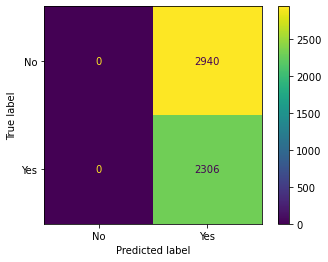

In [34]:
# Cross Validation Scores
cv_scores(dummy_model)

All of the models utilized a pipeline that included the preprocessing steps in order to avoid data leakage. <br>

### First Model: Decision Tree 

The first model I created was a decision tree with all default parameters. My goal here was to purposefully create an overfit model in order to confirm it achieves a high recall score. Accomplishing this shows that I am using good enough data in order to predict the target variable.

In [35]:
# Creating steps for a Pipeline 
tree_steps = [('preprocess', preprocessor),
              ('tree', DecisionTreeClassifier())]

# Feeding the Pipeline the steps defined above
tree_pipe = Pipeline(tree_steps)

# Fitting the training data to the Pipeline
tree_pipe.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/tree_pipe.pkl', 'wb') as f:
    pickle.dump(tree_pipe, f)

In [36]:
# Load the pickled model
with open('pickled_models/tree_pipe.pkl', 'rb') as f:
    tree_pipe = pickle.load(f)

This worked successfully, this model received a recall score of 100% on the training data but 46% with the cross validation, showing this model is very overfit. 

Train Recall:  1.0
CV Recall:  0.47658487571719677

Train F1:  1.0
CV F1:  0.45781142947170805

Train Accuracy:  1.0
CV Accuracy:  0.5184912615189069


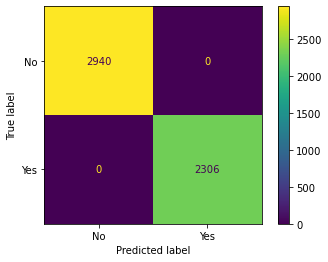

In [37]:
# Cross Validation Scores
cv_scores(tree_pipe)

### Second Model: Random Forest

Created a Random Forest model with default parameters.

In [38]:
# Creating steps for a Pipeline 
forest_steps = [('preprocess', preprocessor),
                ('forest', RandomForestClassifier(random_state=333))]

# Feeding the Pipeline the steps defined above
forest_pipe = Pipeline(forest_steps)

# Fitting the training data to the Pipeline
forest_pipe.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/forest_pipe.pkl', 'wb') as f:
    pickle.dump(forest_pipe, f)

In [39]:
# Load the pickled model
with open('pickled_models/forest_pipe.pkl', 'rb') as f:
    forest_pipe = pickle.load(f)

This model is even more overfit than the Decision Tree. Tuning the parameters should be able to adjust that. 

Train Recall:  1.0
CV Recall:  0.30399188663830745

Train F1:  1.0
CV F1:  0.3971352522656612

Train Accuracy:  1.0
CV Accuracy:  0.5947385718825184


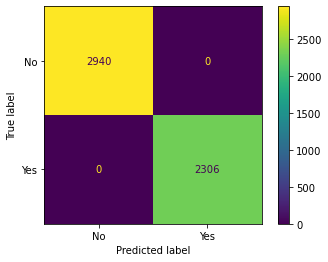

In [40]:
# Evaluate the model
cv_scores(forest_pipe)

#### Random Forest with Grid Search 1

In order to combat the overfit results we used a GridSearch to help tune the hyperparameters.


In [41]:
# Creating parameters for GridSearch
params = {'forest__n_estimators': [50, 100, 150],
          'forest__criterion': ['gini', 'entropy'],
          'forest__max_depth': [10, None],
          'forest__min_samples_split': [2],
          'forest__min_weight_fraction_leaf': [0, .5],
          'forest__max_features': ['auto', None, 15],
          'forest__max_leaf_nodes': [None, 10],
          'forest__min_impurity_decrease': [0, .5],
         }

# GridSearch with the random forest pipeline, parameters above, 5 fold cross validation, and accuracy score
forest_grid1 = GridSearchCV(estimator=forest_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
forest_grid1.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/forest_grid1.pkl', 'wb') as f:
    pickle.dump(forest_grid1, f)

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s


[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10,

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   1.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   2.0s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, for

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__ma

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, fores

[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   2.7s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   2.8s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gin

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dep

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, fores

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__m

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, fore

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entrop

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, fore

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.0s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.9s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__m

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, fore

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entrop

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.5s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.5s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, f

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, f

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.6s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.6s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_dept

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_d

[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=10, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, fo

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  fore

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entrop

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criteri

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   2.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   2.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.5s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  fore

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.0s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   1.0s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, 

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entrop

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=None, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criteri

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   1.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   1.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=entropy, f

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150 
[CV]  forest__criterion=en

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150, total=   0.4s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=150 
[CV]  forest__crit

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=150, total=   0.7s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=entropy, fores

[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=entropy, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=10, forest__min_impurity_decrease=0.5, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=100 
[CV]  forest__criterion=entro

[Parallel(n_jobs=1)]: Done 1440 out of 1440 | elapsed:  9.3min finished


In [43]:
# Load the pickled model
with open('pickled_models/forest_grid1.pkl', 'rb') as f:
    forest_grid1 = pickle.load(f)

This has a slightly better recall score than the basic Random Forest but is still very overfit. 

Recall
Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', StandardScaler(),
                                                  ['Age',
                                                   'Semester_Credit_Load',
                                                   'CGPA']),
                                                 ('ohe',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Course', 'Gender',
                                                   'Relationship_Status',
                                                   'Family_History',
                                                   'Residence_Type',
                                                   'Chronic_Illness']),
                                                 ('ord',
                                                  OrdinalEncoder(categorie

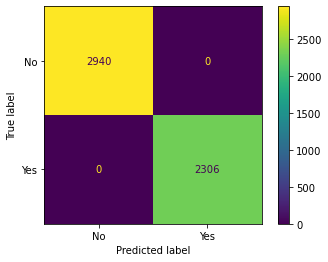

In [44]:
# Evaluate the model
grid_results(forest_grid1)

The GridSearch discovered max_features=15, min_impurity_decrease=0, min_weight_fraction_leaf=0, and n_estimators=50 had the best cross validation score. This is almost the same score as before so I tweaked the paramaters once again.

#### Random Forest with Grid Search 2

Tried to improve results with Grid Search.

In [45]:
# Creating parameters for GridSearch
params = {'forest__n_estimators': [50, 100, 40, 60],
          'forest__criterion': ['gini'],
          'forest__max_depth': [30, 100, None],
          'forest__min_samples_split': [3, 2],
          'forest__min_weight_fraction_leaf': [0, .75, .5, .25],
          'forest__max_features': [15, 20, 10, 'auto'],
          'forest__max_leaf_nodes': [None, 20],
          'forest__min_impurity_decrease': [0, .25],
         }

# GridSearch with the random forest pipeline, parameters above, 5 fold cross validation, and accuracy score
forest_grid2 = GridSearchCV(estimator=forest_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
forest_grid2.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/forest_grid2.pkl', 'wb') as f:
    pickle.dump(forest_grid2, f)

Fitting 5 folds for each of 1536 candidates, totalling 7680 fits
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s


[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=3

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, for

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=3

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dep

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, for

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_fe

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, for

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gin

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.9s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gin

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.9s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.9s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fores

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dep

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, for

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__m

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=1

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, f

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=10

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criteri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criteri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criteri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dep

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_d

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=100, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=100, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=15, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   1.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   1.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gin

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gin

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=N

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=N

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=20, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini,

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=g

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini,

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=N

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_dep

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=N

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, f

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_dept

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, for

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, fores

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=10, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, f

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini,

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, for

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, fore

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__cri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criteri

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__crit

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__cri

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__crit

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criteri

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterio

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__crit

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, fores

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=No

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, fore

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest_

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__m

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini,

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=50 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterio

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=100, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40, total=   0.0s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=40 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.75, forest__n_estimators=60 
[CV]  forest__criterion=gi

/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/imblearn/pipeline.py", line 281, in fit
    self._final_estimator.fit(Xt, yt, **fit_params)
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/sklearn/ensemble/_forest.py", line 386, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/Users/robertdaly/anaconda3/envs/learn-env/lib/python3.8/site-packages/joblib/parallel.py", line 1048, in __call__
    if self.dispatch_one_batch(iterator

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=50 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60, total=   0.1s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.5, forest__n_estimators=60 
[CV]  forest__criterion=gini, 

[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60, total=   0.2s
[CV] forest__criterion=gini, forest__max_depth=None, forest__max_features=auto, forest__max_leaf_nodes=20, forest__min_impurity_decrease=0.25, forest__min_samples_split=2, forest__min_weight_fraction_leaf=0.25, forest__n_estimators=60 
[CV]  forest__criterion=gi

[Parallel(n_jobs=1)]: Done 7680 out of 7680 | elapsed: 27.9min finished


In [46]:
# Load the pickled model
with open('pickled_models/forest_grid2.pkl', 'rb') as f:
    forest_grid2 = pickle.load(f)

This has a slightly better recall score but is still very overfit. 

Recall
Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', StandardScaler(),
                                                  ['Age',
                                                   'Semester_Credit_Load',
                                                   'CGPA']),
                                                 ('ohe',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Course', 'Gender',
                                                   'Relationship_Status',
                                                   'Family_History',
                                                   'Residence_Type',
                                                   'Chronic_Illness']),
                                                 ('ord',
                                                  OrdinalEncoder(categorie

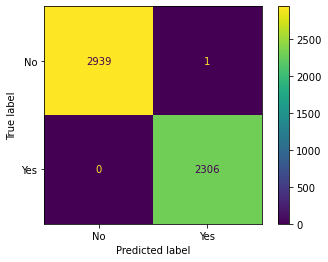

In [47]:
grid_results(forest_grid2)

The GridSearch discovered max_depth=30, max_features=15, min_impurity_decrease=0, min_samples_split=3, min_weight_fraction_leaf=0, and n_estimators=40 had the best cross validation score. This is almost the same score as before so I tweaked the paramaters once again.

#### Random Forest with Grid Search 3

Tried to improve results with Grid Search.

In [48]:
# Creating parameters for GridSearch
params = {'forest__n_estimators': [40],
          'forest__criterion': ['gini'],
          'forest__max_depth': [30, 60],
          'forest__min_samples_split': [3, 4],
          'forest__min_weight_fraction_leaf': [0],
          'forest__max_features': [15, None],
          'forest__max_leaf_nodes': [100, 500, None, 300, 1000],
          'forest__min_impurity_decrease': [0],
         }

# GridSearch with the random forest pipeline, parameters above, 5 fold cross validation, and accuracy score
forest_grid3 = GridSearchCV(estimator=forest_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
forest_grid3.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/forest_grid3.pkl', 'wb') as f:
    pickle.dump(forest_grid3, f)

Fitting 5 folds for each of 40 candidates, totalling 200 fits
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__ma

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest_

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=15, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__ma

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, fo

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.8s
[CV] forest__criterion=gini, forest__max_depth=30, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=30

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=100, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.3s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__ma

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=None, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.5s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.4s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=15, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.7s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=500, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, fo

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s
[CV] forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=300, forest__min_impurity_decrease=0, forest__min_samples_split=3, forest__min_weight_fraction_leaf=0, forest__n_estimators=40 
[CV]  forest__criterion=gini, forest__max_depth=60, fo

[CV]  forest__criterion=gini, forest__max_depth=60, forest__max_features=None, forest__max_leaf_nodes=1000, forest__min_impurity_decrease=0, forest__min_samples_split=4, forest__min_weight_fraction_leaf=0, forest__n_estimators=40, total=   0.6s


[Parallel(n_jobs=1)]: Done 200 out of 200 | elapsed:  1.8min finished


In [49]:
# Load the pickled model
with open('pickled_models/forest_grid3.pkl', 'rb') as f:
    forest_grid3 = pickle.load(f)

This cross validation recall score barely improved and the model is still overfit.

Recall
Pipeline(steps=[('preprocess',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num', StandardScaler(),
                                                  ['Age',
                                                   'Semester_Credit_Load',
                                                   'CGPA']),
                                                 ('ohe',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['Course', 'Gender',
                                                   'Relationship_Status',
                                                   'Family_History',
                                                   'Residence_Type',
                                                   'Chronic_Illness']),
                                                 ('ord',
                                                  OrdinalEncoder(categorie

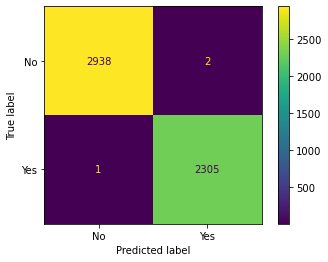

In [50]:
grid_results(forest_grid3)

Because the recall score seems to have plateued, I decided to try a Logistic Regression model.

### Third Model: Logistic Regression

Created a Logistic Regression model with default parameters.

In [51]:
# Creating steps for a Pipeline 
logreg_steps = [('preprocess', preprocessor),
                ('logreg', LogisticRegression(random_state=333))]

# Feeding the Pipeline the steps defined above
logreg_pipe = Pipeline(logreg_steps)

# Fitting the training data to the Pipeline
logreg_pipe.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logreg_pipe.pkl', 'wb') as f:
    pickle.dump(logreg_pipe, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logreg_pipe.pkl', 'rb') as f:
    logreg_pipe = pickle.load(f)

The model does not appear to be overfit, but it is extremely underfit. 

In [ ]:
cv_scores(logreg_pipe)

My first goal was to make the model overfit to ensure that the data could be used in a meaningful way by the model.

#### Logistic Regression with Grid Search 1

Tried to improve results with Grid Search.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced', None],
                'logreg__C': [1, 0.0001],
                'logreg__solver': ['lbfgs', 'sag', 'saga'],
                'logreg__max_iter': [100],
                'logreg__penalty': ['l1', 'l2']}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logreg_grid1 = GridSearchCV(estimator=logreg_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logreg_grid1.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logreg_grid1.pkl', 'wb') as f:
    pickle.dump(logreg_grid1, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logreg_grid1.pkl', 'rb') as f:
    logreg_grid1 = pickle.load(f)

The model successfully overfit and has the highest recall score of any model thus far! 

In [ ]:
grid_results(logreg_grid1)

The grid search selected C=0.0001, class_weight='balanced', penalty='l1', and solver='saga' as the best hyperparameters.

#### Logistic Regression with Grid Search 2

Tried to improve results with Grid Search.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced'],
                'logreg__C': [.0001, .00001, .001],
                'logreg__solver': ['saga', 'liblinear', 'newton-cg'],
                'logreg__max_iter': [50, 100, 150, 1000],
                'logreg__penalty': ['elasticnet', 'l1', None]}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logreg_grid2 = GridSearchCV(estimator=logreg_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logreg_grid2.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logreg_grid2.pkl', 'wb') as f:
    pickle.dump(logreg_grid2, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logreg_grid2.pkl', 'rb') as f:
    logreg_grid2 = pickle.load(f)

The grid search did not change any of the scores. 

In [ ]:
grid_results(logreg_grid2)

The grid search selected C=0.0001, class_weight='balanced', max_iter=50, penalty='l1', and solver='saga' as the best hyperparameters.

#### Logistic Regression with Grid Search 3

Tried to improve results with Grid Search.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced'],
                'logreg__C': [1, .01, .001],
                'logreg__solver': ['saga'],
                'logreg__max_iter': [25, 75],
                'logreg__penalty': ['l1']}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logreg_grid3 = GridSearchCV(estimator=logreg_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logreg_grid3.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logreg_grid3.pkl', 'wb') as f:
    pickle.dump(logreg_grid3, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logreg_grid3.pkl', 'rb') as f:
    logreg_grid3 = pickle.load(f)

This still did not change the scores in a meaningful way.

In [ ]:
grid_results(logreg_grid3)

In order to see an improvement with the model I decided to add polynomial features.

### Fourth Model: Logistic Regression with Polynomial Features

In [ ]:
# Creating steps for a Pipeline 
logregpoly_steps = [('preprocess', preprocessor),
                ('polynomials', PolynomialFeatures()),
                ('logreg', LogisticRegression(max_iter=1000, random_state=333))]

# Feeding the Pipeline the steps defined above
logregpoly_pipe = Pipeline(logregpoly_steps)

# Fitting the training data to the Pipeline
logregpoly_pipe.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logregpoly_pipe.pkl', 'wb') as f:
    pickle.dump(logregpoly_pipe, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logregpoly_pipe.pkl', 'rb') as f:
    logregpoly_pipe = pickle.load(f)

This recall score is already better than the logistic regression with default parameters but is still very underfit. 

In [ ]:
cv_scores(logregpoly_pipe)

My first goal was to make this model overfit so then I could fine tune it.

#### Logistic Regression with Polynomial Features with Grid Search 1

Tried to improve results with Grid Search.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced', None],
                'logreg__C': [1, .01, .001],
                'logreg__solver': ['saga'],
                'logreg__max_iter': [1000, 2000],
                'logreg__penalty': ['l1', 'l2']}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logregpoly_grid1 = GridSearchCV(estimator=logregpoly_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logregpoly_grid1.fit(X_train, y_train)

# Pickle the model
with open('pickled_models/logregpoly_grid1.pkl', 'wb') as f:
    pickle.dump(logregpoly_grid1, f)

In [ ]:
# Load the pickled model
with open('pickled_models/logregpoly_grid1.pkl', 'rb') as f:
    logregpoly_grid1 = pickle.load(f)

This model is much better on recall! It is overfit as I was aiming and it is the highest recall score I've gotten so far. Now I wanted to make it a bit less overfit and see if I can increase the accuracy score as well because right now it may just be choosing 'Yes' majority of the time, which maximizes recall, but is not very accurate.

In [ ]:
grid_results(logregpoly_grid1.best_estimator_)

The grid search selected C=0.001, class_weight='balanced', max_iter=1000, penalty='l1', and solver='saga' as the best hyperparamaters.

#### Logistic Regression with Polynomial Features with Grid Search 2

Tried to improve results with GridSearch.

In [ ]:
# Creating parameters for GridSearch
params = {'logreg__class_weight':['balanced'],
                'logreg__C': [.001, .0001],
                'logreg__solver': ['saga', 'sag', 'lbfjs'],
                'logreg__max_iter': [600, 800, 1000],
                'logreg__penalty': ['l1', 'none'],
         'polynomials__degree': [2]}

# GridSearch with the logistic regression pipeline, parameters above, 5 fold cross validation, and accuracy score
logregpoly_grid2 = GridSearchCV(estimator=logregpoly_pipe, param_grid=params, cv=5, scoring=recall_scorer, verbose=2)

# Fitting the GridSearch
logregpoly_grid2.fit(X_train, y_train)

# Pickle the model
with open('../pickled_models/logregpoly_grid2.pkl', 'wb') as f:
    pickle.dump(logregpoly_grid2.best_estimator_, f)

In [ ]:
# Load the pickled model
with open('../pickled_models/logregpoly_grid2.pkl', 'rb') as f:
    logregpoly_grid2.best_estimator_ = pickle.load(f)

ADD INFO HERE

In [ ]:
grid_results(logregpoly_grid2.best_estimator_)

DESCRIPTION AS TO WHY GBC

### Fifth Model: Gradient Boosting Classifier